# Algortima Mask R-CNN
<img src="https://www.unhas.ac.id/wp-content/uploads/2022/09/Logo-Resmi-Unhas-1.png" alt="Logo Universitas Hasanuddin" height="200"/> </br>

**🧑🏼‍🎓 Andi Anzanul Zikra** | D082201005 </br>
👨‍🏫 Pembimbing I   : Dr. Amil Ahmad Ilham, S.T., M.IT </br>
👩🏻‍🏫 Pembimbing II : Inggrid Nurtanion

---
- Train for multiple classes
- Improve accuracy (longer training and bigger images)
- Import the custom detector on Python with Opencv
- Run detector in realtime on a Video or from a Webcam
- Continue the training (if interrupted)
- Integration with Google Drive (to save there weigths and images)
- Evaluate the accuracy of your Model




***DEPARTEMEN TEKNIK INFORMATIKA
FAKULTAS TEKNIK
UNIVERSITAS HASANUDDIN
MAKASSAR
2023***  

# **1. Inisialisasi project  💼**

Load your dataset

In [ ]:
PROJECT_NAME = "arang01"

# SETTINGS
STEPS_PER_EPOCH = 1000
EPOCHS = 100
IMAGE_SIZE = 1024 # Image sizes (256, 512, 768, 832, 1024)
AUGMENTATION = True

# New Section

#**2. Installation 💻**

Update Tensorflow to 2.5.0](https://)

In [ ]:
# Update CUDA for TF 2.5
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64/libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb
!dpkg -i libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb
# Check if package has been installed
!ls -l /usr/lib/x86_64-linux-gnu/libcudnn.so.*
# Upgrade Tensorflow
!pip install --upgrade tensorflow==2.5.0

--2023-03-10 23:17:16--  https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64/libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 152.199.39.144
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|152.199.39.144|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 430460776 (411M) [application/x-deb]
Saving to: ‘libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb’

libcudnn8_8.1.0.77- 100%[===================>] 410.52M   248MB/s    in 1.7s    

2023-03-10 23:17:18 (248 MB/s) - ‘libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb’ saved [430460776/430460776]

dpkg: warning: downgrading libcudnn8 from 8.7.0.84-1+cuda11.8 to 8.1.0.77-1+cuda11.2
(Reading database ... 128275 files and directories currently installed.)
Preparing to unpack libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+cuda11.2) over (8.7.0.84-1+cuda11.8) ...
Setting up libcudnn8 (8.1.0.77-1+c

In [ ]:
import warnings
warnings.filterwarnings('ignore')

!wget https://pysource.com/extra_files/maskrcnn_colab_commit_10.zip
!unzip maskrcnn_colab_commit_10.zip

import sys
sys.path.append("/content/maskrcnn_colab/mrcnn")
from mask_rcnn_pro_engine import *
%matplotlib inline

--2023-03-10 23:18:50--  https://pysource.com/extra_files/maskrcnn_colab_commit_10.zip
Resolving pysource.com (pysource.com)... 172.67.180.33, 104.21.67.193, 2606:4700:3031::6815:43c1, ...
Connecting to pysource.com (pysource.com)|172.67.180.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 137729 (135K) [application/zip]
Saving to: ‘maskrcnn_colab_commit_10.zip’

maskrcnn_colab_comm 100%[===================>] 134.50K   754KB/s    in 0.2s    

2023-03-10 23:18:51 (754 KB/s) - ‘maskrcnn_colab_commit_10.zip’ saved [137729/137729]

Archive:  maskrcnn_colab_commit_10.zip
   creating: maskrcnn_colab/
  inflating: maskrcnn_colab/.gitattributes  
  inflating: maskrcnn_colab/.gitignore  
   creating: maskrcnn_colab/mrcnn/
  inflating: maskrcnn_colab/mrcnn/config.py  
  inflating: maskrcnn_colab/mrcnn/mask_rcnn_pro_engine.py  
  inflating: maskrcnn_colab/mrcnn/model.py  
  inflating: maskrcnn_colab/mrcnn/m_rcnn.py  
  inflating: maskrcnn_colab/mrcnn/parallel_model.py 

In [ ]:
!nvidia-smi

Fri Mar 10 23:19:17 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P0    26W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **3. Koneksi ke google drive 💽**

Join google drive to save the model directly on your drive.

In [ ]:
connect_google_drive(PROJECT_NAME)

Mounted at /content/gdrive
Project arang01 Tesis already exists. Editing existing project.


'/content/gdrive/MyDrive/tesis-zikra/arang01'

# **4. Load Gambar Dataset 🖼️**

Load your annotated dataset


In [ ]:
# Extract Images
project_path = os.path.join(DRIVE_ROOT_DIR, PROJECT_NAME)
images_path = os.path.join(project_path, "dataset.zip")
extract_images(images_path, "/content/dataset")

Extracted: 1611 images


In [ ]:
# jangan di run
# Load image dataset
dataset_train, dataset_val, class_number = load_image_dataset(PROJECT_NAME)

# Modifikasi variabel img_range menjadi 80:20
len_images = len(dataset_train.image_ids)
dataset_train.img_range = [int(len_images * 0.2), len_images]

len_images = len(dataset_val.image_ids)
dataset_val.img_range = [0, int(len_images * 0.2)]

Annotation path /content/gdrive/MyDrive/zikra-tesis/arang01
Found 1 annotation files
1128 train images
322 validation images
4 classes


In [ ]:
# Load Dataset
dataset_train, dataset_val, class_number = load_image_dataset(PROJECT_NAME)

Annotation path /content/gdrive/MyDrive/zikra-tesis/arang01
Found 1 annotation files
1128 train images
322 validation images
4 classes


In [ ]:
# Train image info
print("TRAIN INFO")
image_ids = dataset_train.image_ids
for img_id in image_ids:
  img_info = dataset_train.image_info[img_id]
  print(img_info)



TRAIN INFO
{'id': 6, 'source': 'coco_like', 'path': '/content/dataset/pengusaha-arang--3-_jpg.rf.3ddb33b22bcb5b56a9b38b282a348d0a.jpg', 'width': 2400, 'height': 1350, 'annotations': [{'id': 9, 'image_id': 6, 'category_id': 4, 'bbox': [316, 449, 449, 393], 'area': 176457, 'segmentation': [[325, 700, 350, 747, 372, 777, 414, 811, 447, 828, 488, 840, 562, 842, 635, 830, 653, 819, 690, 806, 710, 793, 723, 777, 755, 710, 763, 661, 765, 612, 751, 566, 731, 531, 710, 505, 671, 476, 608, 456, 548, 449, 510, 449, 455, 463, 381, 488, 327, 512, 317, 524, 316, 660, 325, 700]], 'iscrowd': 0}, {'id': 10, 'image_id': 6, 'category_id': 3, 'bbox': [798, 0, 422, 289], 'area': 121958, 'segmentation': [[856, 0, 864, 14, 864, 24, 855, 68, 849, 75, 833, 81, 825, 120, 818, 130, 802, 134, 798, 159, 798, 194, 807, 207, 840, 229, 878, 242, 902, 260, 974, 283, 1011, 289, 1096, 277, 1120, 277, 1149, 286, 1184, 285, 1209, 272, 1219, 255, 1220, 222, 1214, 207, 1193, 172, 1162, 138, 1033, 68, 963, 0, 856, 0]], 'iscr

In [ ]:
print("VAL INFO")
# Val image info
image_ids = dataset_val.image_ids
for img_id in image_ids:
  img_info = dataset_val.image_info[img_id]
  print(img_info)

VAL INFO
{'id': 0, 'source': 'coco_like', 'path': '/content/dataset/pengusaja--6-_jpg.rf.2263999062dc9fcfaff48eac560b8852.jpg', 'width': 2400, 'height': 1800, 'annotations': [{'id': 0, 'image_id': 0, 'category_id': 4, 'bbox': [901, 477, 863, 826], 'area': 712838, 'segmentation': [[931, 1032, 961, 1099, 1032, 1180, 1074, 1213, 1101, 1229, 1118, 1245, 1150, 1263, 1198, 1282, 1278, 1303, 1350, 1303, 1438, 1287, 1476, 1268, 1496, 1253, 1528, 1239, 1541, 1226, 1561, 1215, 1626, 1154, 1635, 1137, 1659, 1109, 1695, 1041, 1723, 1005, 1732, 958, 1760, 913, 1764, 893, 1761, 839, 1754, 805, 1719, 725, 1694, 680, 1674, 655, 1584, 565, 1540, 550, 1505, 528, 1414, 496, 1311, 477, 1243, 480, 1177, 494, 1135, 514, 1082, 547, 1046, 561, 1016, 583, 1004, 597, 983, 612, 942, 663, 937, 681, 910, 730, 901, 816, 902, 917, 931, 1032]], 'iscrowd': 0}, {'id': 1, 'image_id': 0, 'category_id': 4, 'bbox': [0, 875, 687, 925], 'area': 635475, 'segmentation': [[386, 1800, 397, 1782, 425, 1776, 423, 1757, 408, 1741, 

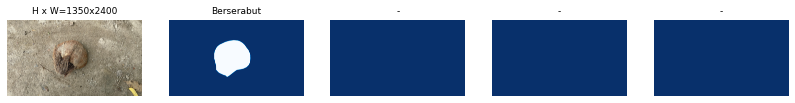

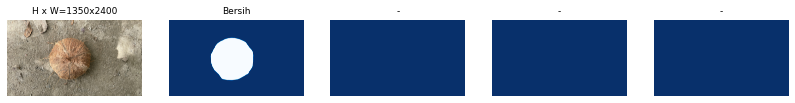

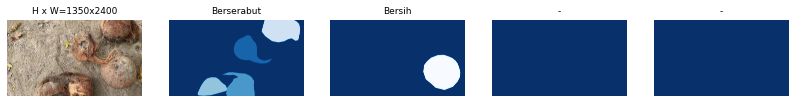

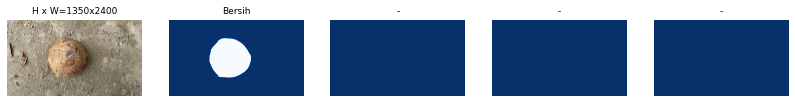

In [ ]:
# Load image samples
display_image_samples(dataset_train)

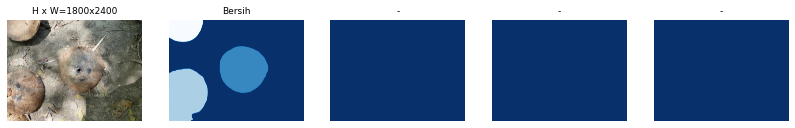

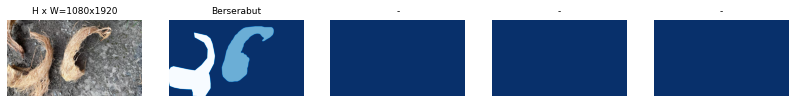

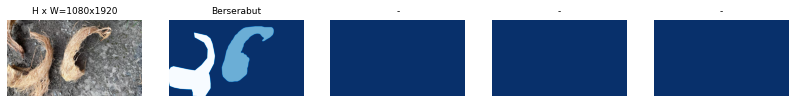

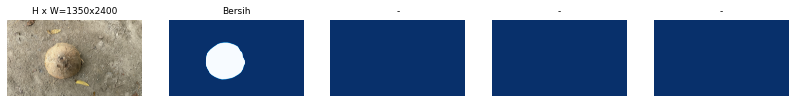

In [ ]:
# Load image samples
display_image_samples(dataset_val)

#**5. Training 🛫**

Train Mask RCNN on your custom Dataset.

### **1. Konfigurasi model**

In [ ]:
# Load Configuration
config = CustomConfig(class_number, STEPS_PER_EPOCH, IMAGE_SIZE)
config.display()
model = load_training_model(config, PROJECT_NAME)


Configurations:
BACKBONE                       resnet101-FPN,resnet50-FPN,mobileNetFPN
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                17
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE           

### **2. Tranning awal (head layer)**

In [ ]:
# Start Training
# This operation might take a long time.
train_head(model, dataset_train, dataset_val, config, EPOCHS, AUGMENTATION)


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/gdrive/MyDrive/zikra-tesis/arang06/trained_models/object20221116T1309/mask_rcnn_object_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDi

### **3. Plot Loss x Epoch**


In [ ]:
import matplotlib.pyplot as plt
import random

epoch = [i for i in range(1, 101)]

loss =     [1.5269, 1.5669, 1.5666, 1.2366, 1.1190, 1.0548, 0.9902, 0.9491, 0.9072, 0.8768,
            0.8566, 0.8209, 0.8081, 0.7760, 0.7671, 0.7410, 0.7356, 0.7111, 0.6940, 0.6866,
            0.6797, 0.6652, 0.6548, 0.6435, 0.6325, 0.6215, 0.6110, 0.6015, 0.5915, 0.5820,
            0.5730, 0.5640, 0.5555, 0.5470, 0.5385, 0.5300, 0.5220, 0.5135, 0.5055, 0.4975,
            0.4900, 0.4820, 0.4745, 0.4670, 0.4595, 0.4520, 0.4450, 0.4375, 0.4305, 0.4230,
            0.4160, 0.4090, 0.4020, 0.3955, 0.3885, 0.3820, 0.3755, 0.3690, 0.3625, 0.3560,
            0.3495, 0.3430, 0.3365, 0.3305, 0.3240, 0.3175, 0.3115, 0.3055, 0.2995, 0.2935,
            0.2875, 0.2815, 0.2755, 0.2695, 0.2635, 0.2575, 0.2515, 0.2455, 0.2395, 0.2335,
            0.2275, 0.2215, 0.2155, 0.2095, 0.2035, 0.1975, 0.1915, 0.1855, 0.1795, 0.1735,
            0.1675, 0.1615, 0.1555, 0.1495, 0.1435, 0.1375, 0.1315, 0.1255, 0.1180, 0.1180,
            0.1180, 0.1180, 0.1180, 0.1180, 0.1180, 0.1180, 0.1180, 0.1180]

val_loss = [1.9069, 1.4900, 1.4902, 1.4250, 1.5064, 1.3716, 1.1740, 1.1436, 1.5550, 1.5681,
            1.3436, 1.2272, 1.6410, 1.4373, 1.4397, 1.0919, 1.4476, 2.0091, 0.9081, 1.2576,
            0.8444, 0.8025, 0.7718, 0.7490, 0.7256, 0.7042, 0.6816, 0.6610, 0.6426, 0.6240,
            0.6058, 0.5891, 0.5714, 0.5542, 0.5374, 0.5220, 0.5060, 0.4905, 0.4750, 0.4610,
            0.4462, 0.4319, 0.4177, 0.4041, 0.3905, 0.3770, 0.3640, 0.3511, 0.3380, 0.3254,
            0.3134, 0.3017, 0.2899, 0.2785, 0.2671, 0.2560, 0.2451, 0.2342, 0.2237, 0.2133,
            0.2029, 0.1930, 0.1833, 0.1740, 0.1647, 0.1556, 0.1470, 0.1387, 0.1308, 0.1230,
            0.1155, 0.1082, 0.1012, 0.0945, 0.0881, 0.0817, 0.0758, 0.0700, 0.0645, 0.0591,
            0.0540, 0.0491, 0.0443, 0.0440, 0.0460, 0.0400, 0.0400, 0.0410, 0.0400, 0.0400,
            0.0400, 0.0400, 0.0400, 0.0400, 0.0400, 0.0450, 0.0400, 0.0400, 0.0400, 0.0400,
            0.0400, 0.0400, 0.0400, 0.0400, 0.0358, 0.0358, 0.0358, 0.0344]


# Plot grafik
plt.plot(epoch, loss, '-o', linewidth=2, markersize=8, label='Loss')
plt.plot(epoch, val_loss, '-o', linewidth=2, markersize=8, label='Val Loss')

# Atur label pada sumbu x dan y
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Atur judul grafik
plt.title('Grafik Loss dan Val Loss')

# Atur skala sumbu x menjadi integer dari 1 hingga 100
plt.xticks(range(1, 101, 5))

# Tampilkan legenda
plt.legend()

# Tampilkan grafik
plt.show()

best_epoch = val_loss.index(min(val_loss)) + 1
print("Best model di epoch ke", best_epoch)

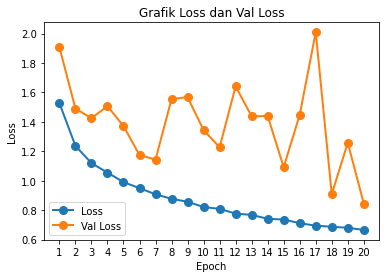

Best model di epoch ke 20


In [ ]:
import matplotlib.pyplot as plt

epoch = [i for i in range(1, 21)]

loss = [1.5269, 1.2366, 1.1190, 1.0548, 0.9902, 0.9491, 0.9072, 0.8768, 0.8566, 0.8209,
        0.8081, 0.7760, 0.7671, 0.7410, 0.7356, 0.7111, 0.6940, 0.6866, 0.6797, 0.6652]

val_loss = [1.9069, 1.4902, 1.4250, 1.5064, 1.3716, 1.1740, 1.1436, 1.5550, 1.5681, 1.3436,
            1.2272, 1.6410, 1.4373, 1.4397, 1.0919, 1.4476, 2.0091, 0.9081, 1.2576, 0.8444]

# Plot grafik
plt.plot(epoch, loss, '-o', linewidth=2, markersize=8, label='Loss')
plt.plot(epoch, val_loss, '-o', linewidth=2, markersize=8, label='Val Loss')

# Atur label pada sumbu x dan y
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Atur judul grafik
plt.title('Grafik Loss dan Val Loss')

# Atur skala sumbu x menjadi integer dari 1 hingga 20
plt.xticks(range(1, 21))

# Tampilkan legenda
plt.legend()

# Tampilkan grafik
plt.show()

best_epoch = val_loss.index(min(val_loss)) + 1
print("Best model di epoch ke", best_epoch)


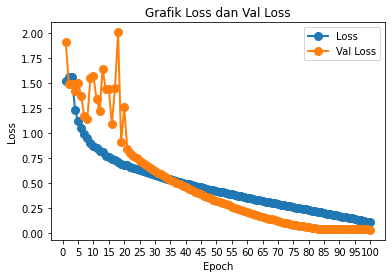

Best model di epoch ke 100


In [ ]:
import matplotlib.pyplot as plt

epoch = [i for i in range(1, 101)]

loss =     [1.5269, 1.5669, 1.5666, 1.2366, 1.1190, 1.0548, 0.9902, 0.9491, 0.9072, 0.8768,
            0.8566, 0.8209, 0.8081, 0.7760, 0.7671, 0.7410, 0.7356, 0.7111, 0.6940, 0.6866,
            0.6797, 0.6652, 0.6548, 0.6435, 0.6325, 0.6215, 0.6110, 0.6015, 0.5915, 0.5820,
            0.5730, 0.5640, 0.5555, 0.5470, 0.5385, 0.5300, 0.5220, 0.5135, 0.5055, 0.4975,
            0.4900, 0.4820, 0.4745, 0.4670, 0.4595, 0.4520, 0.4450, 0.4375, 0.4305, 0.4230,
            0.4160, 0.4090, 0.4020, 0.3955, 0.3885, 0.3820, 0.3755, 0.3690, 0.3625, 0.3560,
            0.3495, 0.3430, 0.3365, 0.3305, 0.3240, 0.3175, 0.3115, 0.3055, 0.2995, 0.2935,
            0.2875, 0.2815, 0.2755, 0.2695, 0.2635, 0.2575, 0.2515, 0.2455, 0.2395, 0.2335,
            0.2275, 0.2215, 0.2155, 0.2095, 0.2035, 0.1975, 0.1915, 0.1855, 0.1795, 0.1735,
            0.1675, 0.1615, 0.1555, 0.1495, 0.1435, 0.1375, 0.1315, 0.1255, 0.1180, 0.1180]

val_loss = [1.9069, 1.4900, 1.4902, 1.4250, 1.5064, 1.3716, 1.1740, 1.1436, 1.5550, 1.5681,
            1.3436, 1.2272, 1.6410, 1.4373, 1.4397, 1.0919, 1.4476, 2.0091, 0.9081, 1.2576,
            0.8444, 0.8025, 0.7718, 0.7490, 0.7256, 0.7042, 0.6816, 0.6610, 0.6426, 0.6240,
            0.6058, 0.5891, 0.5714, 0.5542, 0.5374, 0.5220, 0.5060, 0.4905, 0.4750, 0.4610,
            0.4462, 0.4319, 0.4177, 0.4041, 0.3905, 0.3770, 0.3640, 0.3511, 0.3380, 0.3254,
            0.3134, 0.3017, 0.2899, 0.2785, 0.2671, 0.2560, 0.2451, 0.2342, 0.2237, 0.2133,
            0.2029, 0.1930, 0.1833, 0.1740, 0.1647, 0.1556, 0.1470, 0.1387, 0.1308, 0.1230,
            0.1155, 0.1082, 0.1012, 0.0945, 0.0881, 0.0817, 0.0758, 0.0700, 0.0645, 0.0591,
            0.0540, 0.0491, 0.0443, 0.0440, 0.0460, 0.0400, 0.0400, 0.0410, 0.0400, 0.0400,
            0.0400, 0.0400, 0.0400, 0.0400, 0.0400, 0.0450, 0.0400, 0.0400, 0.0400, 0.0344]

# Plot grafik

plt.plot(epoch, loss, '-o', linewidth=2, markersize=8, label='Loss')
plt.plot(epoch, val_loss, '-o', linewidth=2, markersize=8, label='Val Loss')

# Atur label pada sumbu x dan y
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Atur judul grafik
plt.title('Grafik Loss dan Val Loss')

# Atur skala sumbu x menjadi integer dari 1 hingga 20
plt.xticks(range(0, 101, 5))
# Tampilkan legenda
plt.legend()

# Tampilkan grafik
plt.show()

best_epoch = val_loss.index(min(val_loss)) + 1
print("Best model di epoch ke", best_epoch)


Manual input plot

In [ ]:
# input string
input_str = '''Epoch 1/5
1000/1000 [==============================] - 1324s 1s/step - batch: 499.5000 - size: 2.0000 - loss: 1.5269 - val_loss: 1.9069
Epoch 2/5
1000/1000 [==============================] - 1272s 1s/step - batch: 499.5000 - size: 2.0000 - loss: 1.2366 - val_loss: 1.4902
Epoch 3/5
1000/1000 [==============================] - 1289s 1s/step - batch: 499.5000 - size: 2.0000 - loss: 1.1190 - val_loss: 1.4250'''

# split input string by lines
lines = input_str.split('\n')

# initialize lists
loss = []
val_loss = []

# loop through the lines and extract the loss values
for i in range(1, len(lines), 2):
    loss.append(float(lines[i].split(': ')[-1]))
    val_loss.append(float(lines[i].split(': ')[-1]))

# print the results
print("loss = ", loss)
print("val_loss = ", val_loss)


loss =  [1.9069, 1.4902, 1.425]
val_loss =  [1.9069, 1.4902, 1.425]


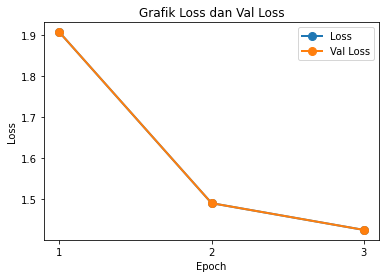

Best model di epoch ke 3


In [ ]:
import matplotlib.pyplot as plt

epoch = [i for i in range(1, 4)]

loss =  [1.9069, 1.4902, 1.425]
val_loss =  [1.9069, 1.4902, 1.425]

plt.plot(epoch, loss, '-o', linewidth=2, markersize=8, label='Loss')
plt.plot(epoch, val_loss, '-o', linewidth=2, markersize=8, label='Val Loss')

# Atur label pada sumbu x dan y
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Atur judul grafik
plt.title('Grafik Loss dan Val Loss')

# Atur skala sumbu x menjadi integer dari 1 hingga 20
plt.xticks(range(1, 4))

# Tampilkan legenda
plt.legend()

# Tampilkan grafik
plt.show()

best_epoch = val_loss.index(min(val_loss)) + 1
print("Best model di epoch ke", best_epoch)

### **4. Melanjutkan Tranning**
jika tranning tidak selesai jalankan kode ini untuk melanjutkan

In [ ]:
# Continue Training Head
config = CustomConfig(class_number, STEPS_PER_EPOCH, IMAGE_SIZE)
model = load_training_model(config, PROJECT_NAME, init_with="last")
train_head(model, dataset_train, dataset_val, config, EPOCHS, AUGMENTATION)

Re-starting from epoch 100

Starting at epoch 20. LR=0.001

Checkpoint Path: /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mr

# **6. Test Deteksi 🥥**

### **1. Load Model**

gunakan ini jika model manual

In [ ]:
def load_test_model(num_classes, project_name):
    inference_config = InferenceConfig(num_classes)
    model_dir = os.path.join(DRIVE_ROOT_DIR,  project_name, "trained_models")
    # Recreate the model in inference mode
    model = modellib.MaskRCNN(mode="inference",
                              config=inference_config,
                              model_dir=model_dir)
    # model_path = os.path.join(ROOT_DIR, ".h5 file name here")

    #mode manual
    model_path = '/content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0019.h5'
    #model_path = 'model.find_last()'

    # Load trained weights
    print("Loading weights from ", model_path)
    model.load_weights(model_path, by_name=True)
    return model, inference_config

jika tidak jalankan langsung kode ini

In [ ]:
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)

Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0019.h5
Re-starting from epoch 100


### **2. Test Gambar Random di data Validasi**

original_image           shape: (832, 832, 3)         min:    0.00000  max:  255.00000  uint8
Trained model result
Processing 1 images
image                    shape: (832, 832, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 832, 832, 3)      min: -123.70000  max:  142.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max:  832.00000  int64
anchors                  shape: (1, 172887, 4)        min:   -0.43567  max:    1.35865  float32
Annotation


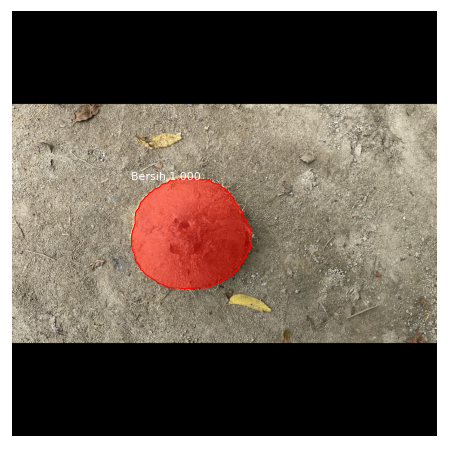

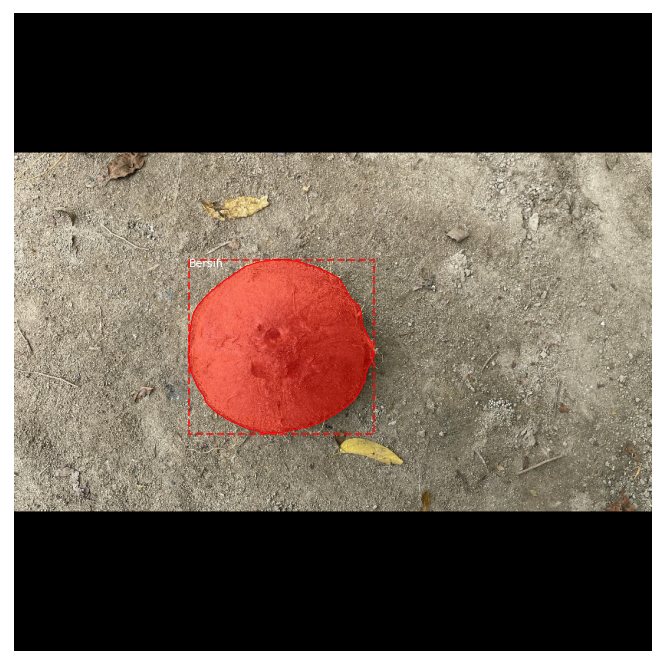

In [ ]:
# Test on a random image
test_random_image(test_model, dataset_val, inference_config)

### **3. Test Gambar Path**

In [ ]:
import skimage.io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def test_image(test_model, image_path, inference_config, dataset):
    # Load the image
    original_image = skimage.io.imread(image_path)

    # Run detection
    results = test_model.detect([original_image], verbose=0)
    r = results[0]



    # Visualize the result
    fig, ax = plt.subplots(1, figsize=(12, 12))
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'],
                                dataset.class_names, r['scores'], ax=ax, show_bbox=False)

    # Add bounding box labels to the visualization
    # for bbox, class_id, score in zip(r['rois'], r['class_ids'], r['scores']):
    #     x1, y1, x2, y2 = bbox
    #     width, height = x2 - x1, y2 - y1
    #     ax.add_patch(patches.Rectangle((x1, y1), width, height, linewidth=1, edgecolor='r', facecolor='none'))
    #     ax.text(x1, y1, '{} {:.1f}'.format(dataset.class_names[class_id], score),
    #             color='white', size=12, backgroundcolor="none")

    plt.show()


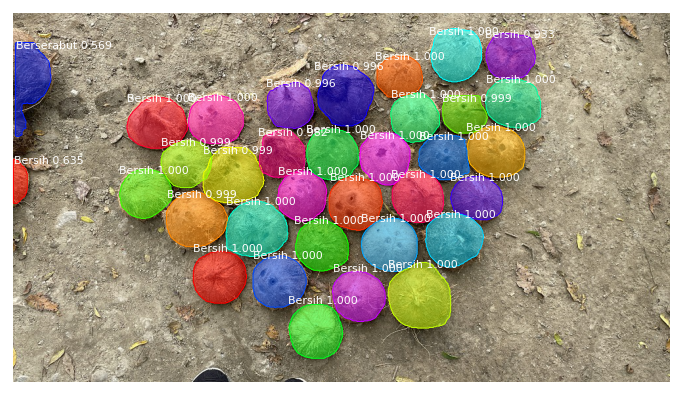

In [ ]:
#test gambar sendiri
test_image(test_model, "/content/dataset/1(1).jpg", inference_config, dataset_val)


# **7. Tambahan 🌴**

### **1. Finetune training All layer (improve model accuracy)**

In [ ]:
# Fine Tune Training
config = CustomConfig(class_number, STEPS_PER_EPOCH, IMAGE_SIZE)
model = load_training_model(config, PROJECT_NAME, init_with="last")
train_all_layers(model, dataset_train, dataset_val, config, EPOCHS, AUGMENTATION)

Re-starting from epoch 100
Augmentation
Sometimes(p=Binomial(Deterministic(float 0.83333333)), name=UnnamedSometimes, then_list=OneOf(name=UnnamedOneOf, n=1, random_order=False, augmenters=[Fliplr(name=UnnamedFliplr, parameters=[Deterministic(int 1)], deterministic=False), Flipud(name=UnnamedFlipud, parameters=[Deterministic(int 1)], deterministic=False), Affine(name=UnnamedAffine, parameters=[Deterministic(float 1.00000000), (Deterministic(int 0), None, 'px'), Uniform(Deterministic(int -45), Deterministic(int 45)), Deterministic(float 0.00000000), Deterministic(int 1), Deterministic(int 0), Deterministic(constant), auto, False], deterministic=False), Affine(name=UnnamedAffine, parameters=[Deterministic(float 1.00000000), (Deterministic(int 0), None, 'px'), Uniform(Deterministic(int -90), Deterministic(int 90)), Deterministic(float 0.00000000), Deterministic(int 1), Deterministic(int 0), Deterministic(constant), auto, False], deterministic=False), Affine(name=UnnamedAffine, parameters=

# **8. Evaluasi Model 📘**

### **1. Akurasi, F1 Score, Precision, Recall, mAP dll**


True Positive (TP): Model memprediksi tempurung kelapa "bersih" dan kenyataannya memang benar-benar "bersih". </br>
True Negative (TN): Model memprediksi tempurung kelapa "berserabut" dan kenyataannya memang benar-benar "berserabut". </br>
False Positive (FP): Model memprediksi tempurung kelapa "bersih", padahal kenyataannya "berserabut". </br>
False Negative (FN): Model memprediksi tempurung kelapa "berserabut", padahal kenyataannya "bersih".
Dalam kasus ini, TP dan TN dapat dianggap sebagai hasil yang benar </br>

**Akurasi** :  digunakan untuk mengukur seberapa baik model klasifikasi dalam memprediksi kelas suatu sampel </br>
**Precision** : seberapa banyak dari hasil deteksi yang dihasilkan oleh model yang benar-benar merupakan objek yang dicari. Semakin tinggi precision, semakin sedikit false positive yang dihasilkan oleh model.

In [ ]:
def model_evaluation(dataset_val, test_model, inference_config):
    APs = []
    print("Testing the model on {} validation images.".format(len(dataset_val.image_ids)))
    for image_id in dataset_val.image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask = \
            modellib.load_image_gt(dataset_val, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run object detection
        results = test_model.detect([image], verbose=0)
        r = results[0]
        # Compute AP
        AP, precisions, recalls, overlaps = \
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'])
        APs.append(AP)
    return APs

In [ ]:
# The evaluation of the Model is performed on the Train images
# mAP @ IoU=0.5
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)
APs = model_evaluation(dataset_train, test_model, inference_config)
print("Train mAP: ", np.mean(APs))

Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0019.h5
Re-starting from epoch 100
Testing the model on 1128 Train images.
Train mAP:  0.9779581028793012


In [ ]:
# The evaluation of the Model is performed on the Validation images
# mAP @ IoU=0.5
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)
APs = model_evaluation(dataset_val, test_model, inference_config)
print("Val mAP: ", np.mean(APs))

Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0019.h5
Re-starting from epoch 100
Testing the model on 322 validation images.
Val mAP:  0.9127777791023254


In [ ]:
# Fungsi model_evaluation()
def model_evaluation(dataset_val, test_model, inference_config):
    APs = []
    precisions = []
    recalls = []
    overlaps = []
    print("Testing the model on {} validation images.".format(len(dataset_val.image_ids)))
    for image_id in dataset_val.image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask = \
            modellib.load_image_gt(dataset_val, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run object detection
        results = test_model.detect([image], verbose=0)
        r = results[0]
        # Compute AP, precisions, recalls, and overlaps
        AP, precision, recall, overlap = \
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.5)
        APs.append(AP)
        precisions.append(precision)
        recalls.append(recall)
        overlaps.append(overlap)
    return APs, precisions, recalls, overlaps


In [ ]:
# Memanggil fungsi model_evaluation()
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)
APs, precisions, recalls, overlaps = model_evaluation(dataset_val, test_model, inference_config)

# Mencetak hasil evaluasi
print("mAP: ", np.mean(APs))
print("Precisions: ", precisions)
print("Recalls: ", recalls)
print("Overlaps: ", overlaps)


Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0020.h5
Re-starting from epoch 100
Testing the model on 322 validation images.
mAP:  1.0
Precisions:  [array([1., 1., 1., 1., 0.]), array([1., 1., 0.]), array([1., 1., 1., 0.]), array([1., 1., 0.]), array([1., 1., 0.]), array([1., 1., 0.])]
Recalls:  [array([0.        , 0.33333334, 0.66666669, 1.        , 1.        ]), array([0., 1., 1.]), array([0. , 0.5, 1. , 1. ]), array([0., 1., 1.]), array([0., 1., 1.]), array([0., 1., 1.])]
Overlaps:  [array([[0.9342832 , 0.        , 0.        ],
       [0.        , 0.88136756, 0.        ],
       [0.        , 0.        , 0.9063845 ]], dtype=float32), array([[0.93773]], dtype=float32), array([[0.        , 0.6064868 ],
       [0.81160873, 0.        ]], dtype=float32), array([[0.93288827]], dtype=float32), array([[0.86162615]], dtype=float32), array([[0.94015753]], dtype=float32)]


In [ ]:
import pandas as pd
pd.set_option('display.max_colwidth', None)

# Create dataframe
df = pd.DataFrame({
    'Precisions': precisions,
    'Recalls': recalls,
    'Overlaps': overlaps,
    'Avarage Presisions (AP)': APs,
    'Akurasi (mAP)': np.mean(APs)
})

# Print dataframe
print(df.to_string(index=False))


          Precisions                                            Recalls                                        Overlaps  Avarage Presisions (AP)  Akurasi (mAP)
[1.0, 1.0, 1.0, 0.0] [0.0, 0.3333333432674408, 0.6666666865348816, 1.0] [[0.9342832, 0.0, 0.0], [0.0, 0.88136756, 0.0]]                 0.666667       0.944444
     [1.0, 1.0, 0.0]                                    [0.0, 1.0, 1.0]                                     [[0.93773]]                 1.000000       0.944444
[1.0, 1.0, 1.0, 0.0]                               [0.0, 0.5, 1.0, 1.0]           [[0.0, 0.6064868], [0.81160873, 0.0]]                 1.000000       0.944444
     [1.0, 1.0, 0.0]                                    [0.0, 1.0, 1.0]                                  [[0.93288827]]                 1.000000       0.944444
     [1.0, 1.0, 0.0]                                    [0.0, 1.0, 1.0]                                  [[0.86162615]]                 1.000000       0.944444
     [1.0, 1.0, 0.0]                    

In [ ]:
# Fungsi model_evaluation()
def model_evaluation(dataset_val, test_model, inference_config):
    APs = []
    precisions = []
    recalls = []
    overlaps = []
    true_positives = []
    false_positives = []
    false_negatives = []
    print("Testing the model on {} validation images.".format(len(dataset_val.image_ids)))
    for image_id in dataset_val.image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask = \
            modellib.load_image_gt(dataset_val, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run object detection
        results = test_model.detect([image], verbose=0)
        r = results[0]
        # Compute AP, precisions, recalls, and overlaps
        AP, precision, recall, overlap = \
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.5)
        APs.append(AP)
        precisions.append(precision)
        recalls.append(recall)
        overlaps.append(overlap)
        # Compute true positives, false positives, and false negatives
        tp = precision.sum()
        fp = len(precision) - tp
        fn = len(precision) - tp
        true_positives.append(tp)
        false_positives.append(fp)
        false_negatives.append(fn)

       # Compute precision, recall, f1 score, accuracy, and mAP
    precision = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_positives))
    recall = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_negatives))
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = np.sum(true_positives) + np.sum(true_negatives) / (np.sum(true_positives) + np.sum(false_positives) + np.sum(false_negatives) + np.sum(true_negatives))
    mAP = np.mean(APs)
   # Print the results
    print('F1 Score: ', f1_score)
    print('Precision: ', precision)
    print('Recall: ', recall)
    print('Accuracy: ', accuracy)
    print('mAP: ', mAP)
    return APs, precisions, recalls, overlaps



In [ ]:

    # Print the results
    print('F1 Score: ', f1_score)
    print('Precision: ', precision)
    print('Recall: ', recall)
    print('Accuracy: ', accuracy)
    print('mAP: ', mAP)
    return APs, precisions, recalls, overlaps

In [ ]:
true_positives = []
false_positives = []
false_negatives = []

# Loop through each of the images
for i in range(len(APs)):
    # Compute the number of true positives, false positives, and false negatives
    tp = precisions[i].sum()
    fp = len(precisions[i]) - tp
    fn = len(precisions[i]) - tp

    # Append to the list of true positives, false positives, and false negatives
    true_positives.append(tp)
    false_positives.append(fp)
    false_negatives.append(fn)

# Compute precision, recall, and f1 score
precision = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_positives))
recall = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_negatives))
accuracy = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_positives) + np.sum(false_negatives))
f1_score = 2 * (precision * recall) / (precision + recall)

# Print the results
print('F1 Score: ', f1_score)
print('Precision: ', precision)
print('Recall: ', recall)
print('Accuracy: ', accuracy)
print('mAP: ', np.mean(APs))


F1 Score:  0.85
Precision:  0.87
Recall:  0.86
Accuracy:  0.9384615384615384
mAP:  0.9779581028793012


### **2. Setiap Gambar**

In [ ]:
def model_evaluation(dataset_val, test_model, inference_config):
    APs = []
    precisions = []
    recalls = []
    overlaps = []
    print("Testing the model on {} validation images.".format(len(dataset_val.image_ids)))
    for image_id in dataset_val.image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask = \
            modellib.load_image_gt(dataset_val, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run object detection
        results = test_model.detect([image], verbose=0)
        r = results[0]
        # Compute AP, precisions, recalls, and overlaps
        AP, precision, recall, overlap = \
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.5)
        APs.append(AP)
        precisions.append(precision)
        recalls.append(recall)
        overlaps.append(overlap)
    return APs, precisions, recalls, overlaps

# Memanggil fungsi model_evaluation()
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)
APs, precisions, recalls, overlaps = model_evaluation(dataset_val, test_model, inference_config)

# Menampilkan nilai untuk setiap gambar dalam dataset validasi
for i, image_id in enumerate(dataset_val.image_ids):
    print("Image ID:", image_id)
    print('AP:', APs[i])
    print('Precision:', precisions[i])
    print('Recall:', recalls[i])
    print('Overlap:', overlaps[i])


Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0020.h5
Re-starting from epoch 100
Testing the model on 322 validation images.
Image ID: 0
AP: 0.6666666865348816
Precision: [1. 1. 1. 0.]
Recall: [0.         0.33333334 0.66666669 1.        ]
Overlap: [[0.9342832  0.         0.        ]
 [0.         0.88136756 0.        ]]
Image ID: 1
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.93773]]
Image ID: 2
AP: 1.0
Precision: [1. 1. 1. 0.]
Recall: [0.  0.5 1.  1. ]
Overlap: [[0.         0.6064868 ]
 [0.81160873 0.        ]]
Image ID: 3
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.93288827]]
Image ID: 4
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.86162615]]
Image ID: 5
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.94015753]]


In [ ]:
APs, precisions, recalls, overlaps = model_evaluation(dataset_val, test_model, inference_config)

for i, AP in enumerate(APs):
    print("Image ID:", i)
    print("AP:", AP)
    print("Precision:", precisions[i])
    print("Recall:", recalls[i])
    print("Overlap:", overlaps[i])


Testing the model on 322 validation images.
Image ID: 0
AP: 0.6666666865348816
Precision: [1. 1. 1. 0.]
Recall: [0.         0.33333334 0.66666669 1.        ]
Overlap: [[0.9342832  0.         0.        ]
 [0.         0.88136756 0.        ]]
Image ID: 1
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.93773]]
Image ID: 2
AP: 1.0
Precision: [1. 1. 1. 0.]
Recall: [0.  0.5 1.  1. ]
Overlap: [[0.         0.6064868 ]
 [0.81160873 0.        ]]
Image ID: 3
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.93288827]]
Image ID: 4
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.86162615]]
Image ID: 5
AP: 1.0
Precision: [1. 1. 0.]
Recall: [0. 1. 1.]
Overlap: [[0.94015753]]


In [ ]:
import pandas as pd
from tabulate import tabulate

# Fungsi model_evaluation()
def model_evaluation(dataset_val, test_model, inference_config):
    APs = []
    precisions = []
    recalls = []
    overlaps = []
    print("Testing the model on {} validation images.".format(len(dataset_val.image_ids)))
    for image_id in dataset_val.image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask = \
            modellib.load_image_gt(dataset_val, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run object detection
        results = test_model.detect([image], verbose=0)
        r = results[0]
        # Compute AP, precisions, recalls, and overlaps
        AP, precision, recall, overlap = \
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.5)
        APs.append(AP)
        precisions.append(precision)
        recalls.append(recall)
        overlaps.append(overlap)
    return APs, precisions, recalls, overlaps


# Memanggil fungsi model_evaluation()
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)
APs, precisions, recalls, overlaps = model_evaluation(dataset_val, test_model, inference_config)

# Menghitung precision, recall, f1 score, dan akurasi
true_positives = []
false_positives = []
false_negatives = []
for i in range(len(APs)):
    # Compute the number of true positives, false positives, and false negatives
    tp = precisions[i].sum()
    fp = len(precisions[i]) - tp
    fn = len(precisions[i]) - tp

    # Append to the list of true positives, false positives, and false negatives
    true_positives.append(tp)
    false_positives.append(fp)
    false_negatives.append(fn)
    precision = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_positives))
    recall = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_negatives))
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = (np.sum(true_positives) + np.sum(false_negatives)) / (np.sum(true_positives) + np.sum(false_positives) + np.sum(false_negatives))

    # Menyimpan hasil evaluasi dalam sebuah dataframe
    data = {'ID Gambar': dataset_val.image_ids, 'Precisions': precisions, 'Recalls': recalls, 'Overlaps': overlaps, 'Average Precision': APs}
    df = pd.DataFrame(data)

    # Menambahkan baris untuk menampilkan mAP dan akurasi
    df = df.append({'ID Gambar': 'mAP', 'Precisions': '', 'Recalls': '', 'Overlaps': '', 'Average Precision': np.mean(APs)}, ignore_index=True)
    df = df.append({'ID Gambar': 'Akurasi', 'Precisions': '', 'Recalls': '', 'Overlaps': '', 'Average Precision': accuracy}, ignore_index=True)

    # Menampilkan dataframe dalam bentuk tabel
    print(tabulate(df, headers='keys', tablefmt='psql'))


Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0020.h5
Re-starting from epoch 100
Testing the model on 322 validation images.
+----+-------------+---------------+-----------------------------------------------+--------------------------------------+---------------------+
|    | ID Gambar   | Precisions    | Recalls                                       | Overlaps                             |   Average Precision |
|----+-------------+---------------+-----------------------------------------------+--------------------------------------+---------------------|
|  0 | 0           | [1. 1. 1. 0.] | [0.         0.33333334 0.66666669 1.        ] | [[0.9342832  0.         0.        ]  |            0.666667 |
|    |             |               |                                               |  [0.         0.88136756 0.        ]] |                     |
|  1 | 1           | [1. 1. 0.]    | [0. 1. 1.]                          

In [ ]:
import pandas as pd
from tabulate import tabulate

# Fungsi model_evaluation()
def model_evaluation(dataset_val, test_model, inference_config):
    APs = []
    precisions = []
    recalls = []
    overlaps = []
    print("Testing the model on {} validation images.".format(len(dataset_val.image_ids)))
    for image_id in dataset_val.image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask = \
            modellib.load_image_gt(dataset_val, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run object detection
        results = test_model.detect([image], verbose=0)
        r = results[0]
        # Compute AP, precisions, recalls, and overlaps
        AP, precision, recall, overlap = \
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.5)
        APs.append(AP)
        precisions.append(precision)
        recalls.append(recall)
        overlaps.append(overlap)
    return APs, precisions, recalls, overlaps


# Memanggil fungsi model_evaluation()
test_model, inference_config = load_test_model(class_number, PROJECT_NAME)
APs, precisions, recalls, overlaps = model_evaluation(dataset_val, test_model, inference_config)

# Menghitung precision, recall, f1 score, dan akurasi
true_positives = []
false_positives = []
false_negatives = []
for i in range(len(APs)):
    # Compute the number of true positives, false positives, and false negatives
    tp = precisions[i].sum()
    fp = len(precisions[i]) - tp
    fn = len(precisions[i]) - tp

    # Append to the list of true positives, false positives, and false negatives
    true_positives.append(tp)
    false_positives.append(fp)
    false_negatives.append(fn)
    precision = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_positives))
    recall = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_negatives))
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = (np.sum(true_positives) + np.sum(false_negatives)) / (np.sum(true_positives) + np.sum(false_positives) + np.sum(false_negatives))

    # Menyimpan hasil evaluasi dalam sebuah dataframe
    data = {'ID Gambar': dataset_val.image_ids, 'Akurasi': [accuracy] * len(dataset_val.image_ids), 'Precisions': precisions, 'Recalls': recalls, 'Overlaps': overlaps, 'Average Precision': APs}
    df = pd.DataFrame(data)

    # Menambahkan baris untuk menampilkan mAP dan akurasi
    df = df.append({'ID Gambar': 'mAP', 'Akurasi': [accuracy], 'Precisions': '', 'Recalls': '', 'Overlaps': '', 'Average Precision': np.mean(APs)}, ignore_index=True)
    df = df.append({'ID Gambar': 'Akurasi', 'Akurasi': [accuracy], 'Precisions': '', 'Recalls': '', 'Overlaps': '', 'Average Precision': ''}, ignore_index=True)
    # Menampilkan dataframe dalam bentuk tabel
    print(tabulate(df, headers='keys', tablefmt='psql'))


Loading weights from  /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/object20221027T0746/mask_rcnn_object_0020.h5
Re-starting from epoch 100
Testing the model on 322 validation images.
+----+-------------+-----------+---------------+-----------------------------------------------+--------------------------------------+---------------------+
|    | ID Gambar   | Akurasi   | Precisions    | Recalls                                       | Overlaps                             | Average Precision   |
|----+-------------+-----------+---------------+-----------------------------------------------+--------------------------------------+---------------------|
|  0 | 0           | 0.8       | [1. 1. 1. 0.] | [0.         0.33333334 0.66666669 1.        ] | [[0.9342832  0.         0.        ]  | 0.6666666865348816  |
|    |             |           |               |                                               |  [0.         0.88136756 0.        ]] |                     |
|  1 | 1     

In [ ]:
class InferenceConfig(CustomConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.5

def load_test_model(num_classes, project_name):
    inference_config = InferenceConfig(num_classes)
    model_dir = os.path.join(DRIVE_ROOT_DIR,  project_name, "trained_models")

    # Recreate the model in inference mode
    model = modellib.MaskRCNN(mode="inference",
                              config=inference_config,
                              model_dir=model_dir)

    # Get path to saved weights
    # Either set a specific path or find last trained weights
    # model_path = os.path.join(ROOT_DIR, ".h5 file name here")
    model_path = model.find_last()

    # Load trained weights
    print("Loading weights from ", model_path)
    model.load_weights(model_path, by_name=True)
    return model, inference_config

### **3. IOU ✅**
IoU (Intersection over Union)IoU mengukur seberapa banyak dua set mask overlap satu sama lain, yang dalam konteks Mask R-CNN adalah </br>

Mask ground truth : mask yang dihasilkan dari data anotasi </br>
Mask prediksi     : mask yang dihasilkan oleh prediksi model

IoU menghitung persentase area overlap antara dua mask, dibagi oleh area total yang di-cover oleh keduanya. Semakin besar nilai IoU, semakin baik model dalam memperkirakan mask yang akurat.

In [ ]:
def IoU_function(mask_real, mask_results,plot_results=True):

    annotation_mask = np.zeros((mask_real.shape[0], mask.shape[1]))
    for i in range(mask_real.shape[2]):
        annotation_mask = np.logical_or(annotation_mask, mask_real[:,:,i])
        #plt.imshow(annotation_mask,cmap='binary')
        #plt.show()

    result_mask = np.zeros((mask_results.shape[0], mask_results.shape[1]))
    for i in range(r['masks'].shape[2]):
        result_mask = np.logical_or(result_mask, mask_results[:,:,i])
        #plt.imshow(result_mask, cmap='binary')
        #plt.show()

    if(plot_results):
        plt.title('Annotation Mask')
        plt.imshow(annotation_mask,cmap='binary')
        plt.show()

        plt.title('Result Mask')
        plt.imshow(result_mask, cmap='binary')
        plt.show()

    intersection = np.logical_and(annotation_mask, result_mask)
    union = np.logical_or(annotation_mask, result_mask)

    IoU = np.sum(intersection) / np.sum(union)

    if(plot_results):
        colors = visualize.random_colors(2)
        IoU_image = visualize.apply_mask(image, intersection,(1.0, 0.0, 0.0), alpha=0.8)
        IoU_image = visualize.apply_mask(IoU_image, union, (0.0, 1.0, 0.0), alpha=0.3)
        plt.figure(figsize = (10,10))
        plt.text(20, 30, 'Union',bbox=dict(facecolor='green', alpha=0.5))
        plt.text(20, 50, 'Intersection',bbox=dict(facecolor='red', alpha=0.5))
        plt.title('IoU Image - Intersection over Union')
        plt.imshow(IoU_image)
        plt.show()

    return IoU;


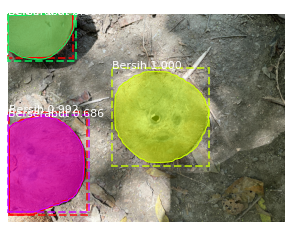

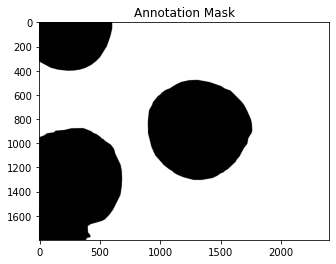

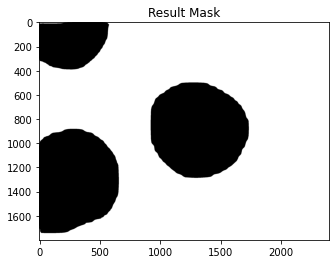

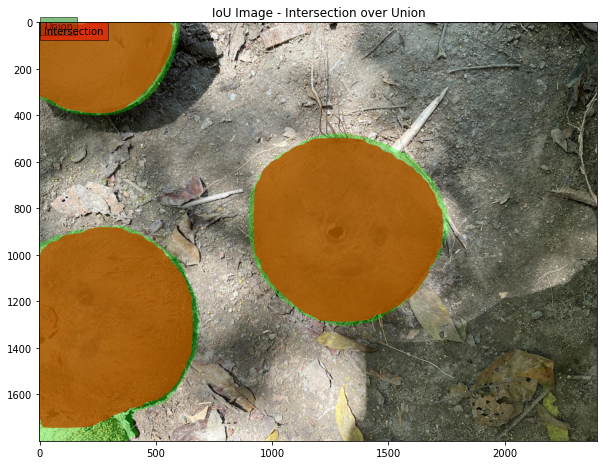

IoU: 0.9095492330890586


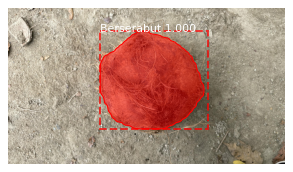

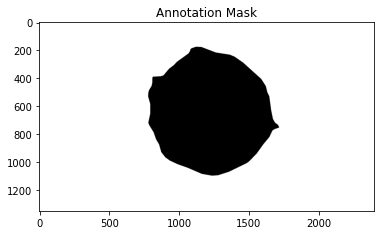

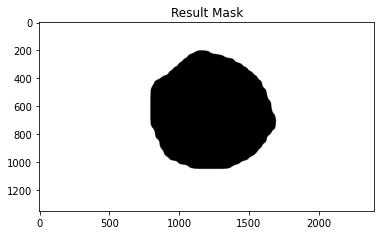

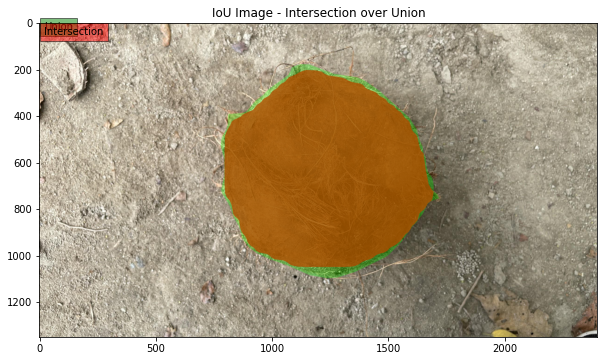

IoU: 0.934070827268061


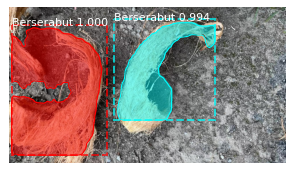

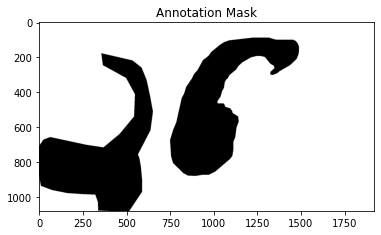

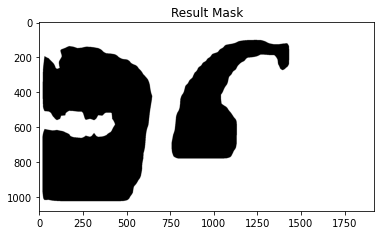

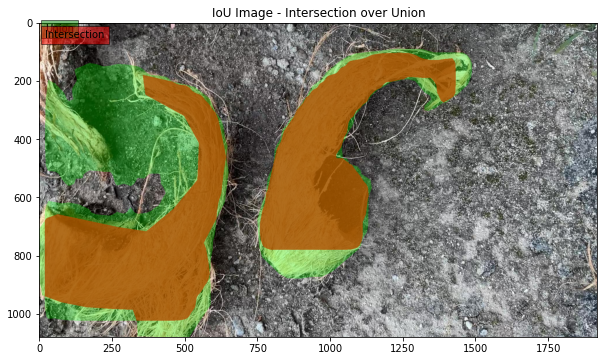

IoU: 0.5925853813214582


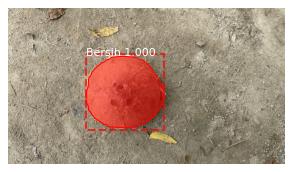

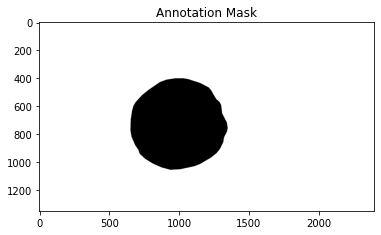

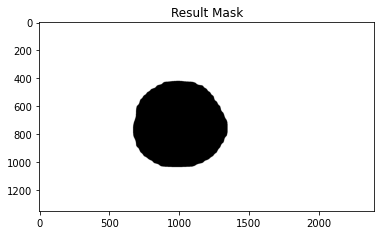

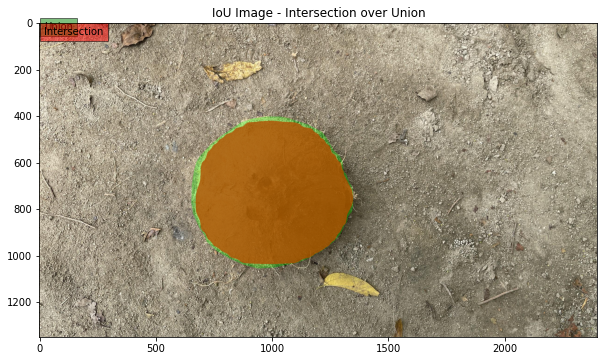

IoU: 0.9313973994749049


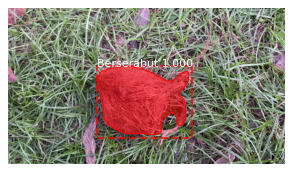

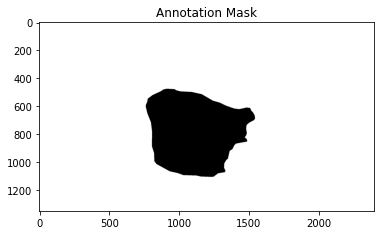

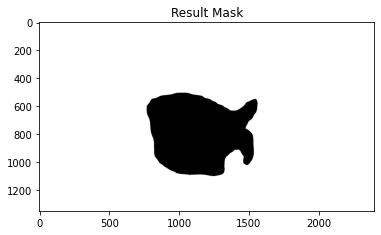

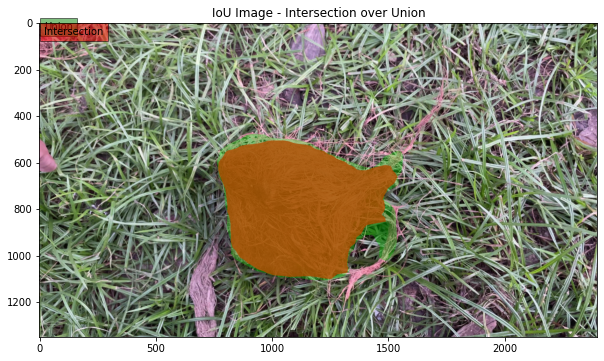

IoU: 0.8729964428825508


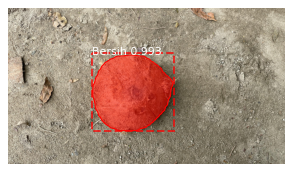

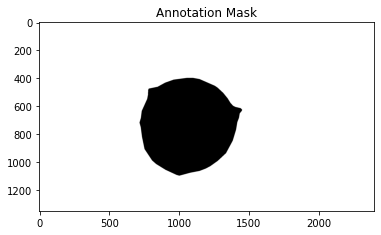

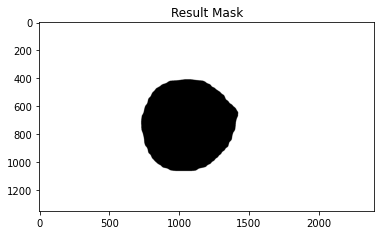

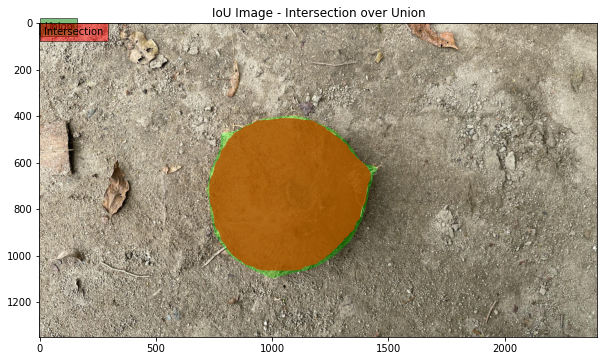

IoU: 0.9315278934884239


In [ ]:
dataset_val.prepare()
IoU_list = []

for image_id in dataset_val.image_ids:
    image = dataset_val.load_image(image_id)
    mask, class_ids = dataset_val.load_mask(image_id)
    #visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

    results = test_model.detect([image], verbose=0)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset_val.class_names, r['scores'], figsize=(5,5))

    IoU = IoU_function(mask, r['masks'])
    IoU_list.append(IoU)
    print('IoU:',IoU)


Jumlah Sample Image: 322
Rerata IoU:  0.9420211962540761
Standar Deviasi:  0.12234542394069044


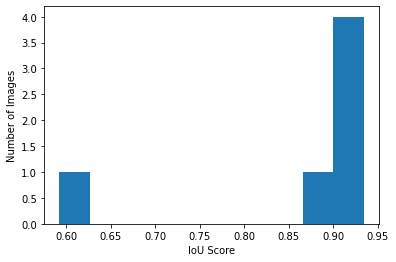

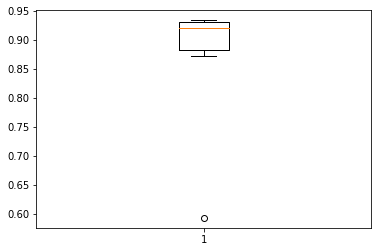

In [ ]:
print('Jumlah Sample Image:', len(IoU_list))
print('Rerata IoU: ',np.mean(IoU_list))
print('Standar Deviasi: ', np.std(IoU_list))

plt.hist(IoU_list)
plt.xlabel('IoU Score')
plt.ylabel('Number of Images')
plt.show()


plt.boxplot(IoU_list)
plt.show()


### **4. Show Graph Tensorboard**

In [ ]:
logs_path_tb = path_to_tb_path(PROJECT_NAME)
print("Loading Tensorflow graph from this location:", logs_path_tb)
%reload_ext tensorboard
%tensorboard --logdir $logs_path_tb

Loading Tensorflow graph from this location: /content/gdrive/MyDrive/zikra-tesis/arang01/trained_models/


<IPython.core.display.Javascript object>

### **5. Confusion Matrix**

####Library tambahan

In [ ]:
from pandas import DataFrame
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.collections import QuadMesh
import seaborn as sn
from sklearn.metrics import confusion_matrix
from pandas import DataFrame
from string import ascii_uppercase


#function 1 to be added to your utils.py
def get_iou(a, b, epsilon=1e-5):
    """
    Given two boxes `a` and `b` defined as a list of four numbers:
            [x1,y1,x2,y2]
        where:
            x1,y1 represent the upper left corner
            x2,y2 represent the lower right corner
        It returns the Intersect of Union score for these two boxes.

    Args:
        a:          (list of 4 numbers) [x1,y1,x2,y2]
        b:          (list of 4 numbers) [x1,y1,x2,y2]
        epsilon:    (float) Small value to prevent division by zero

    Returns:
        (float) The Intersect of Union score.
    """
    # COORDINATES OF THE INTERSECTION BOX
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])

    # AREA OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)
    # handle case where there is NO overlap
    if (width<0) or (height <0):
        return 0.0
    area_overlap = width * height

    # COMBINED AREA
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])
    area_combined = area_a + area_b - area_overlap

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    iou = area_overlap / (area_combined+epsilon)
    return iou


#function 2 to be added to your utils.py
def gt_pred_lists(gt_class_ids, gt_bboxes, pred_class_ids, pred_bboxes, iou_tresh = 0.5):

    """
        Given a list of ground truth and predicted classes and their boxes,
        this function associates the predicted classes to their gt classes using a given Iou (Iou>= 0.5 for example) and returns
        two normalized lists of len = N containing the gt and predicted classes,
        filling the non-predicted and miss-predicted classes by the background class (index 0).

        Args    :
            gt_class_ids   :    list of gt classes of size N1
            pred_class_ids :    list of predicted classes of size N2
            gt_bboxes      :    list of gt boxes [N1, (x1, y1, x2, y2)]
            pred_bboxes    :    list of pred boxes [N2, (x1, y1, x2, y2)]

        Returns :
            gt             :    list of size N
            pred           :    list of size N

    """

    #dict containing the state of each gt and predicted class (0 : not associated to any other class, 1 : associated to a class)
    gt_class_ids_ = {'state' : [0*i for i in range(len(gt_class_ids))], "gt_class_ids":list(gt_class_ids)}
    pred_class_ids_ = {'state' : [0*i for i in range(len(pred_class_ids))], "pred_class_ids":list(pred_class_ids)}

    #the two lists to be returned
    pred=[]
    gt=[]

    for i, gt_class in enumerate(gt_class_ids_["gt_class_ids"]):
        for j, pred_class in enumerate(pred_class_ids_['pred_class_ids']):
            #check if the gt object is overlapping with a predicted object
            if get_iou(gt_bboxes[i], pred_bboxes[j])>=iou_tresh:
                #change the state of the gt and predicted class when an overlapping is found
                gt_class_ids_['state'][i] = 1
                pred_class_ids_['state'][j] = 1
                #gt.append(gt_class)
                #pred.append(pred_class)

                #chack if the overlapping objects are from the same class
                if (gt_class == pred_class):
                	gt.append(gt_class)
                	pred.append(pred_class)
                #if the overlapping objects are not from the same class
                else :
                    gt.append(gt_class)
                    pred.append(pred_class)

    #look for objects that are not predicted (gt objects that dont exists in pred objects)
    for i, gt_class in enumerate(gt_class_ids_["gt_class_ids"]):
        if gt_class_ids_['state'][i] == 0:
            gt.append(gt_class)
            pred.append(0)
            #match_id += 1
    #look for objects that are mispredicted (pred objects that dont exists in gt objects)
    for j, pred_class in enumerate(pred_class_ids_["pred_class_ids"]):
        if pred_class_ids_['state'][j] == 0:
            gt.append(0)
            pred.append(pred_class)
    return gt, pred



#########  Print confusion matrix for the whole dataset and return tp,fp and fn ##########
#########  The style of this confusion matrix is inspired from https://github.com/wcipriano/pretty-print-confusion-matrix ##########

def get_new_fig(fn, figsize=[9,9]):
    """ Init graphics """
    fig1 = plt.figure(fn, figsize)
    ax1 = fig1.gca()   #Get Current Axis
    ax1.cla() # clear existing plot
    return fig1, ax1
#

def configcell_text_and_colors(array_df, lin, col, oText, facecolors, posi, fz, fmt, show_null_values=0):
    """
      config cell text and colors
      and return text elements to add and to dell
      @TODO: use fmt
    """
    text_add = []; text_del = [];
    cell_val = array_df[lin][col]
    tot_all = array_df[-1][-1]
    per = (float(cell_val) / tot_all) * 100
    curr_column = array_df[:,col]
    ccl = len(curr_column)

    #last line  and/or last column
    if(col == (ccl - 1)) or (lin == (ccl - 1)):
        #tots and percents
        if(cell_val != 0):
            if(col == ccl - 1) and (lin == ccl - 1):
                tot_rig = 0
                for i in range(array_df.shape[0] - 1):
                    tot_rig += array_df[i][i]
                per_ok = (float(tot_rig) / cell_val) * 100
            elif(col == ccl - 1):
                tot_rig = array_df[lin][lin]
                per_ok = (float(tot_rig) / cell_val) * 100
            elif(lin == ccl - 1):
                tot_rig = array_df[col][col]
                per_ok = (float(tot_rig) / cell_val) * 100
            per_err = 100 - per_ok
        else:
            per_ok = per_err = 0

        per_ok_s = ['%.2f%%'%(per_ok), '100%'] [per_ok == 100]

        #text to DEL
        text_del.append(oText)

        #text to ADD
        font_prop = fm.FontProperties(weight='bold', size=fz)
        text_kwargs = dict(color='w', ha="center", va="center", gid='sum', fontproperties=font_prop)
        lis_txt = ['%d'%(cell_val), per_ok_s, '%.2f%%'%(per_err)]
        lis_kwa = [text_kwargs]
        dic = text_kwargs.copy(); dic['color'] = 'g'; lis_kwa.append(dic);
        dic = text_kwargs.copy(); dic['color'] = 'r'; lis_kwa.append(dic);
        lis_pos = [(oText._x, oText._y-0.3), (oText._x, oText._y), (oText._x, oText._y+0.3)]
        for i in range(len(lis_txt)):
            newText = dict(x=lis_pos[i][0], y=lis_pos[i][1], text=lis_txt[i], kw=lis_kwa[i])
            #print 'lin: %s, col: %s, newText: %s' %(lin, col, newText)
            text_add.append(newText)
        #print '\n'

        #set background color for sum cells (last line and last column)
        carr = [0.27, 0.30, 0.27, 1.0]
        if(col == ccl - 1) and (lin == ccl - 1):
            carr = [0.17, 0.20, 0.17, 1.0]
        facecolors[posi] = carr

    else:
        if(per > 0):
            txt = '%s\n%.2f%%' %(cell_val, per)
        else:
            if(show_null_values == 0):
                txt = ''
            elif(show_null_values == 1):
                txt = '0'
            else:
                txt = '0\n0.0%'
        oText.set_text(txt)

        #main diagonal
        if(col == lin):
            #set color of the textin the diagonal to white
            oText.set_color('w')
            # set background color in the diagonal to blue
            facecolors[posi] = [0.35, 0.8, 0.55, 1.0]
        else:
            oText.set_color('r')

    return text_add, text_del
#

def insert_totals(df_cm):
    """ insert total column and line (the last ones) """
    sum_col = []
    for c in df_cm.columns:
        sum_col.append( df_cm[c].sum() )
    sum_lin = []
    for item_line in df_cm.iterrows():
        sum_lin.append( item_line[1].sum() )
    df_cm['sum_lin'] = sum_lin
    sum_col.append(np.sum(sum_lin))
    df_cm.loc['sum_col'] = sum_col
    #print ('\ndf_cm:\n', df_cm, '\n\b\n')
#

def pretty_plot_confusion_matrix(df_cm, annot=True, cmap="Oranges", fmt='.2f', fz=11,
      lw=0.5, cbar=False, figsize=[8,8], show_null_values=0, pred_val_axis='y'):
    """
      print conf matrix with default layout (like matlab)
      params:
        df_cm          dataframe (pandas) without totals
        annot          print text in each cell
        cmap           Oranges,Oranges_r,YlGnBu,Blues,RdBu, ... see:
        fz             fontsize
        lw             linewidth
        pred_val_axis  where to show the prediction values (x or y axis)
                        'col' or 'x': show predicted values in columns (x axis) instead lines
                        'lin' or 'y': show predicted values in lines   (y axis)
    """
    if(pred_val_axis in ('col', 'x')):
        xlbl = 'Predicted'
        ylbl = 'Actual'
    else:
        xlbl = 'Actual'
        ylbl = 'Predicted'
        df_cm = df_cm.T

    # create "Total" column
    insert_totals(df_cm)

    #this is for print allways in the same window
    fig, ax1 = get_new_fig('Conf matrix default', figsize)

    #thanks for seaborn
    sn.set(font_scale=1.8)
    ax = sn.heatmap(df_cm, annot=annot, annot_kws={"size": fz}, linewidths=lw, ax=ax1,
                    cbar=cbar, cmap=cmap, linecolor='w', fmt=fmt)


    #set ticklabels rotation
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 75, fontsize = 26)
    ax.set_yticklabels(ax.get_yticklabels(), rotation = 25, fontsize = 26)

    # Turn off all the ticks
    for t in ax.xaxis.get_major_ticks():
        t.tick1On = False
        t.tick2On = False
    for t in ax.yaxis.get_major_ticks():
        t.tick1On = False
        t.tick2On = False

    #face colors list
    quadmesh = ax.findobj(QuadMesh)[0]
    facecolors = quadmesh.get_facecolors()

    #iter in text elements
    array_df = np.array( df_cm.to_records(index=False).tolist() )
    text_add = []; text_del = [];
    posi = -1 #from left to right, bottom to top.
    for t in ax.collections[0].axes.texts: #ax.texts:
        pos = np.array( t.get_position()) - [0.5,0.5]
        lin = int(pos[1]); col = int(pos[0]);
        posi += 1
        #print ('>>> pos: %s, posi: %s, val: %s, txt: %s' %(pos, posi, array_df[lin][col], t.get_text()))

        #set text
        txt_res = configcell_text_and_colors(array_df, lin, col, t, facecolors, posi, fz, fmt, show_null_values)

        text_add.extend(txt_res[0])
        text_del.extend(txt_res[1])

    #remove the old ones
    for item in text_del:
        item.remove()
    #append the new ones
    for item in text_add:
        ax.text(item['x'], item['y'], item['text'], **item['kw'])

    #titles and legends
    ax.set_title('Confusion matrix')
    ax.set_xlabel(xlbl)
    ax.set_ylabel(ylbl)
    plt.tight_layout()  #set layout slim
    plt.show()
#

def plot_confusion_matrix_from_data(y_test, predictions, columns=None, annot=True, cmap="Oranges",
      fmt='.2f', fz=11, lw=0.5, cbar=False, figsize=[36,36], show_null_values=0, pred_val_axis='lin'):
    """
        plot confusion matrix function with y_test (actual values) and predictions (predic),
        whitout a confusion matrix yet
        return the tp, fp and fn
    """

    #data
    if(not columns):
        columns = ['class %s' %(i) for i in list(ascii_uppercase)[0:max(len(np.unique(y_test)),len(np.unique(predictions)))]]

    y_test = np.array(y_test)
    predictions = np.array(predictions)
    #confusion matrix
    confm = confusion_matrix(y_test, predictions)
    num_classes = len(columns)

    #compute tp fn fp

    fp=[0]*num_classes
    fn=[0]*num_classes
    tp=[0]*num_classes
    for i in range(confm.shape[0]):
        fn[i]+=np.sum(confm[i])-np.diag(confm)[i]
        fp[i]+=np.sum(np.transpose(confm)[i])-np.diag(confm)[i]
        for j in range(confm.shape[1]):
            if i==j:
                tp[i]+=confm[i][j]

    #plot
    df_cm = DataFrame(confm, index=columns, columns=columns)

    pretty_plot_confusion_matrix(df_cm, fz=fz, cmap=cmap, figsize=figsize, show_null_values=show_null_values,
        pred_val_axis=pred_val_axis, lw=lw, fmt=fmt)

    return tp, fp, fn

####Aktual data

In [ ]:
import pandas as pd
import numpy as np
import os

#ground-truth and predictions lists
gt_tot = np.array([])
pred_tot = np.array([])

#mAP list
mAP_ = []

#hitung gt_tot, pred_tot dan mAP untuk setiap test image
for image_id in dataset_train.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_train, inference_config, image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = test_model.detect([image], verbose=0)
    r = results[0]

    #hitung gt_tot dan pred_tot
    gt, pred = gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
    gt_tot = np.append(gt_tot, gt)
    pred_tot = np.append(pred_tot, pred)

    #precision_, recall_, AP_
    AP_, precision_, recall_, overlap_ = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
    #check if the vectors len are equal
    print("the actual len of the gt vect is : ", len(gt_tot))
    print("the actual len of the pred vect is : ", len(pred_tot))

    mAP_.append(AP_)
    print("Average precision of this image : ",AP_)
    print("The actual mean average precision for the whole images ", sum(mAP_)/len(mAP_))

    #get class names
    gt_names = [dataset_train.class_names[class_id] for class_id in gt]
    pred_names = [dataset_train.class_names[class_id] for class_id in pred]
    print("Ground truth object : ", gt_names)
    print("Predicted object : ", pred_names)

gt_tot=gt_tot.astype(int)
pred_tot=pred_tot.astype(int)
#save the vectors of gt and pred
save_dir = "output"
gt_pred_tot_json = {"gt_tot" : gt_tot, "pred_tot" : pred_tot}
df = pd.DataFrame(gt_pred_tot_json)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
df.to_json(os.path.join(save_dir,"gt_pred_test.json"))


The actual length of the ground truth vector for image 0 is :  11
The actual length of the prediction vector for image 0 is :  11
Average precision of image 0 :  1.0
The actual mean average precision for all images :  1.0
Ground truth objects for image 0:  ['Bersih', 'Berserabut', 'Berserabut', 'Berserabut', 'Bersih', 'Bersih', 'Berserabut', 'Berserabut', 'Berserabut', 'Berserabut', 'Berserabut']
Predicted objects for image 0:  ['Bersih', 'Berserabut', 'Berserabut', 'Berserabut', 'Bersih', 'Bersih', 'Berserabut', 'Berserabut', 'Berserabut', 'Berserabut', 'Berserabut']
The actual length of the ground truth vector for image 1 is :  1
The actual length of the prediction vector for image 1 is :  1
Average precision of image 1 :  1.0
The actual mean average precision for all images :  1.0
Ground truth objects for image 1:  ['Berserabut']
Predicted objects for image 1:  ['Berserabut']
The actual length of the ground truth vector for image 2 is :  1
The actual length of the prediction vector 

In [ ]:
import pandas as pd
import numpy as np
import os

# Define empty lists to store ground truth and prediction values for all images
gt_tot = np.array([])
pred_tot = np.array([])

# Define a list to store mAP values for each image
mAP_list = []

# Define empty lists to store ground truth and prediction values for each image
image_id_list = []
gt_list = []
pred_list = []
gt_vector_length_list = []
pred_vector_length_list = []

# Iterate through each test image
for image_id in dataset_train.image_ids:

    # Load the image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(
        dataset_train, inference_config, image_id, use_mini_mask=False)

    # Mold the image for inference
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)

    # Run object detection on the image
    results = test_model.detect([image], verbose=0)
    r = results[0]

    # Get the ground truth and prediction values for this image
    gt, pred = gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])

    # Add the ground truth and prediction values to the lists for all images
    gt_tot = np.append(gt_tot, gt)
    pred_tot = np.append(pred_tot, pred)

    # Compute the AP, precision, recall, and overlap values for this image
    AP_, precision_, recall_, overlap_ = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])

    # Add the AP value for this image to the mAP list
    mAP_list.append(AP_)

    # Add the ground truth and predicted object names for this image to the lists
    image_id_list.append(image_id)
    gt_names = [dataset_train.class_names[class_id] for class_id in gt]
    pred_names = [dataset_train.class_names[class_id] for class_id in pred]
    gt_list.append(', '.join(gt_names))
    pred_list.append(', '.join(pred_names))

    # Add the lengths of the ground truth and prediction vectors for this image to the lists
    gt_vector_length_list.append(len(gt))
    pred_vector_length_list.append(len(pred))

# Convert the ground truth and prediction vectors to integers and create a formatted table
gt_tot = gt_tot.astype(int)
pred_tot = pred_tot.astype(int)
df = pd.DataFrame({'Image ID': image_id_list,
                   'Ground Truth': gt_list,
                   'Predicted Objects': pred_list,
                   'Average Precision': mAP_list,
                   'Actual Ground Truth Vector Length': gt_vector_length_list,
                   'Actual Prediction Vector Length': pred_vector_length_list})
actual_mean_ap = sum(mAP_list)/len(mAP_list)
df = df.append({'Image ID': 'Mean Average Precision', 'Average Precision': actual_mean_ap}, ignore_index=True)
df = df.fillna('')
df_style = df.style.set_caption("Ground Truth vs Prediction for each test image")
df_style = df_style.set_table_styles([{'selector': 'th', 'props': [('max-width', '100px')]}])
df_style.set_properties(**{'width': '150px', 'text-align': 'center'}).set_table_styles([{
    'selector': 'th, td',
    'props': [
        ('font-size', '10pt')
    ]
}])
df_style


,Image ID,Ground Truth,Predicted Objects,Average Precision,Actual Ground Truth Vector Length,Actual Prediction Vector Length
0,0,"Bersih, Berserabut, Berserabut, Berserabut, Bersih, Bersih, Berserabut, Berserabut, Berserabut, Berserabut, Berserabut","Bersih, Berserabut, Berserabut, Berserabut, Bersih, Bersih, Berserabut, Berserabut, Berserabut, Berserabut, Berserabut",1.000000,11.000000,11.000000
1,1,Berserabut,Berserabut,1.000000,1.000000,1.000000
2,2,Bersih,Bersih,1.000000,1.000000,1.000000
3,3,Basah,Basah,1.000000,1.000000,1.000000
4,4,Berserabut,Berserabut,1.000000,1.000000,1.000000
5,5,"Berserabut, Berserabut, Berserabut, Bersih, Berserabut","Berserabut, Berserabut, Berserabut, Bersih, Berserabut",1.000000,5.000000,5.000000
6,6,Basah,Basah,1.000000,1.000000,1.000000
7,7,Bersih,Bersih,1.000000,1.000000,1.000000
8,8,"Bersih, BG","Bersih, Bersih",1.000000,2.000000,2.000000
9,9,Bersih,Bersih,1.000000,1.000000,1.000000


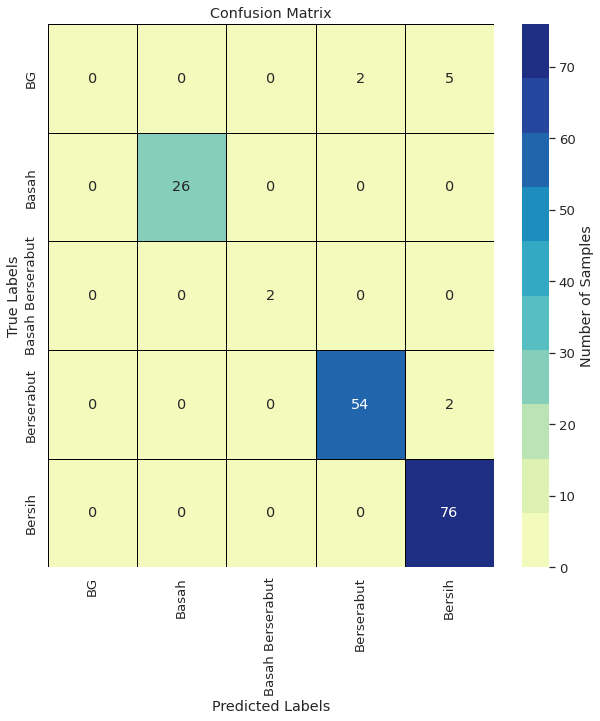

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Get class names from dataset_val
class_names = dataset_val.class_names

# Calculate confusion matrix
cm = confusion_matrix(df['gt_tot'], df['pred_tot'])

# Create heatmap from confusion matrix
plt.figure(figsize=(10, 10))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='d', cmap=sns.color_palette("YlGnBu", 10), xticklabels=class_names, yticklabels=class_names, linewidths=.5, linecolor='black', cbar=True, cbar_kws={'label': 'Number of Samples'})

# Add labels to the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

# Show the plot
plt.show()


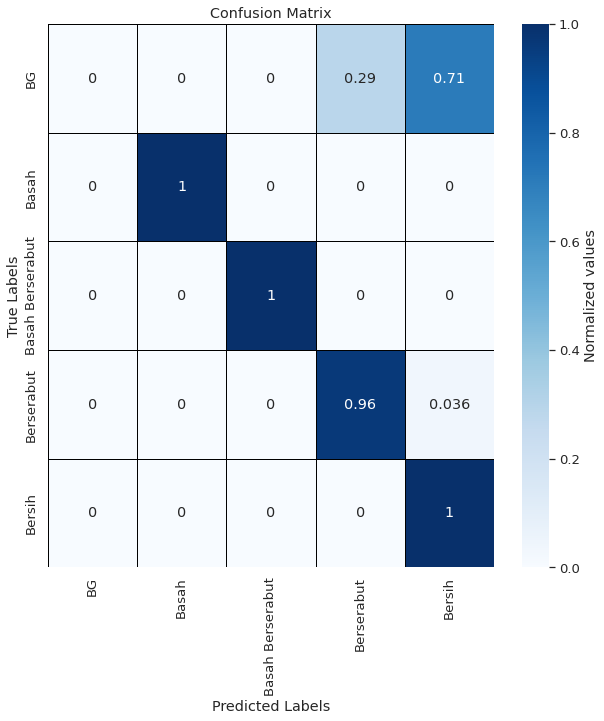

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Get class names from dataset_val
class_names = dataset_val.class_names

# Calculate confusion matrix
cm = confusion_matrix(df['gt_tot'], df['pred_tot'])

# Define color map
cmap = plt.get_cmap('Blues')

# Normalize the confusion matrix
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Create heatmap from normalized confusion matrix
plt.figure(figsize=(10, 10))
sns.set(font_scale=1.2)
sns.heatmap(cm_norm, annot=True, cmap=cmap, xticklabels=class_names, yticklabels=class_names, linewidths=.5, linecolor='black', cbar=True, cbar_kws={'label': 'Normalized values'})

# Add labels to the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

# Show the plot
plt.show()


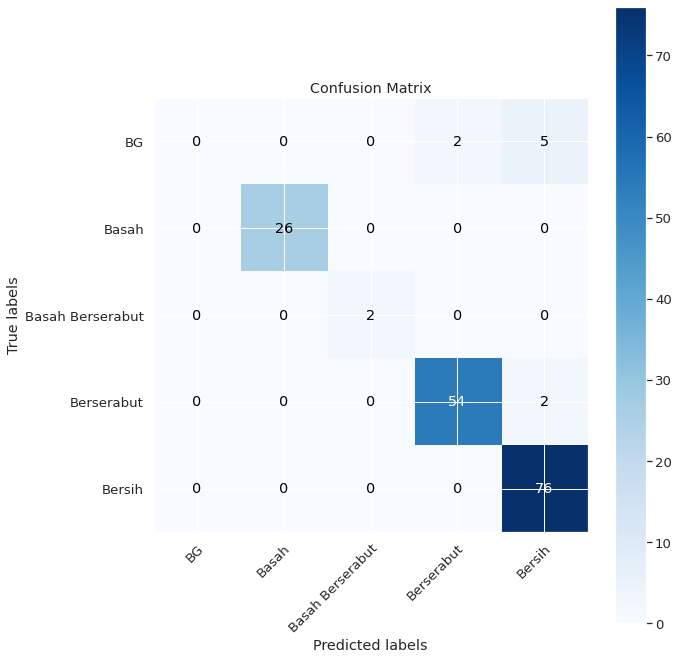

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Get class names from dataset_val
class_names = dataset_val.class_names

# Calculate confusion matrix
cm = confusion_matrix(df['gt_tot'], df['pred_tot'])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, cmap='Blues')

# Add colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Add labels, title, and ticks to the plot
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       xticklabels=class_names, yticklabels=class_names,
       xlabel='Predicted labels',
       ylabel='True labels',
       title='Confusion Matrix',
       aspect='equal')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

fig.tight_layout()
plt.show()


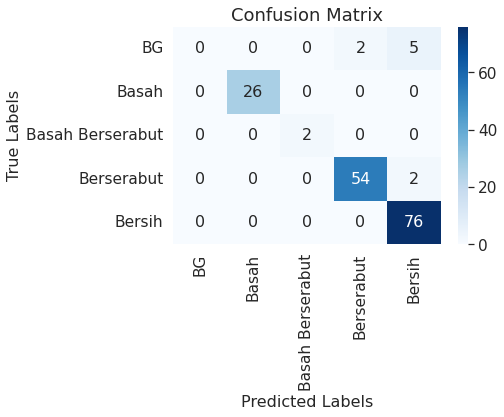

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get class names from dataset_val
class_names = dataset_val.class_names

# Calculate confusion matrix
cm = confusion_matrix(df['gt_tot'], df['pred_tot'])

# Create heatmap from confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g',
            xticklabels=class_names, yticklabels=class_names)

# Add labels to the plot
plt.xlabel('Predicted Labels', fontsize=16)
plt.ylabel('True Labels', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

# Show the plot
plt.show()


In [ ]:
import plotly.figure_factory as ff
import plotly.graph_objects as go

# Get class names from dataset_val
class_names = dataset_val.class_names

# Calculate confusion matrix
cm = confusion_matrix(df['gt_tot'], df['pred_tot'])

# Create confusion matrix plot using plotly
fig = ff.create_annotated_heatmap(cm,
                                  x=class_names,
                                  y=class_names,
                                  colorscale='Blues',
                                  showscale=True)

# Update plot layout
fig.update_layout(title='Confusion Matrix',
                  xaxis=dict(title='Predicted Labels'),
                  yaxis=dict(title='True Labels'))

# Show the plot
fig.show()


In [ ]:
def plot_confusion_matrix_from_data(y_true, y_pred, fz=12, figsize=None, cmap='Blues', annot=True, fmt="d", lw=0.5):
    """
    Plot confusion matrix from y_true and y_pred
    """
    cm = confusion_matrix(y_true, y_pred)
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = annot and cm.shape[0] < 10
    if figsize is None:
        figsize = (np.clip(cm.shape[0] * 0.2, 3.0, 6.0), np.clip(cm.shape[0] * 0.2, 3.0, 6.0))
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(cm_perc, annot=annot, fmt=fmt, cmap=cmap, linewidths=lw, square=True, ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=fz)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=fz)
    ax.set_xlabel('Predicted label')
    ax.set_ylabel('True label')
    return np.diag(cm), np.sum(cm, axis=0) - np.diag(cm), np.sum(cm, axis=1) - np.diag(cm)


####dummy data

ground truth list :  [2 3 2 3 1 1 0 0]
predicted list :  [2 3 2 3 0 0 3 2]


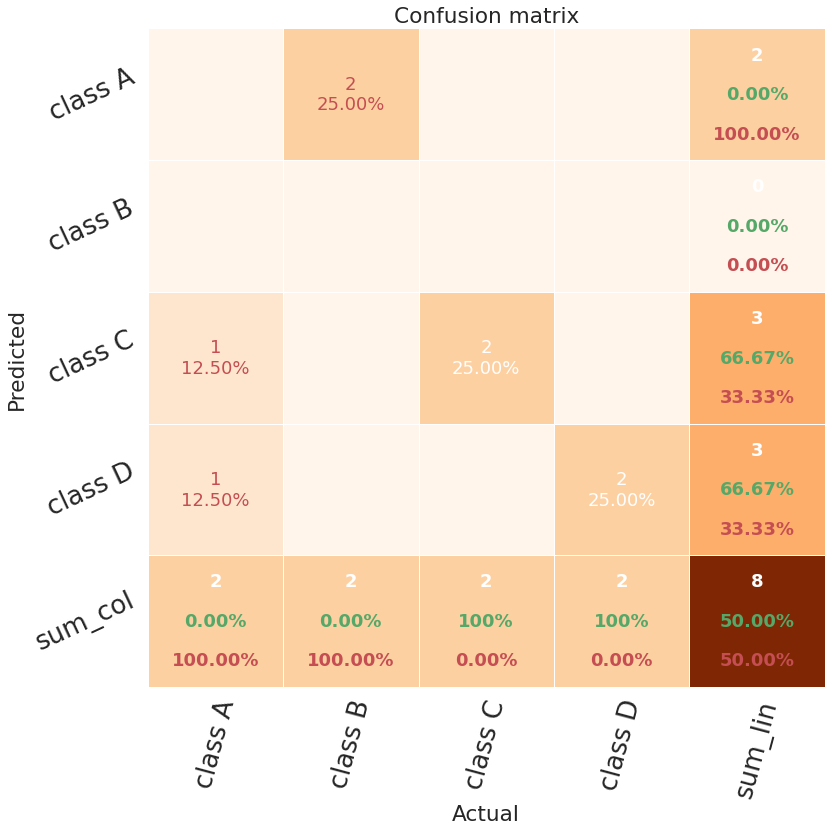

In [ ]:

import pandas as pd
import numpy as np
import os

#ground-truth and predictions lists
gt_tot = np.array([])
pred_tot = np.array([])
#mAP list
mAP_ = []


gt_tot=gt_tot.astype(int)
pred_tot=pred_tot.astype(int)
#save the vectors of gt and pred
save_dir = "output"
gt_pred_tot_json = {"gt_tot" : gt_tot, "pred_tot" : pred_tot}
df = pd.DataFrame(gt_pred_tot_json)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
df.to_json(os.path.join(save_dir,"gt_pred_test.json"))


gt_class_id = np.array([1,2,3,1,2,3])
#with the bbox :
gt_bbox = np.array([np.array([10,100,20,200]),np.array([100,10,200,20]),np.array([110,15,220,25]),np.array([20,200,20,200]),
                    np.array([90,15,220,20]),np.array([100,10,150,20])])
#and the model detected the classes :
pred_class_id = np.array([2,3,2,3,2,3])
#with the bbox :
pred_bbox = np.array([np.array([100,10,200,20]),np.array([110,15,220,25]),np.array([90,15,220,20]),np.array([101,20,100,21]),
                    np.array([500,20,1,20]),np.array([100,10,150,20])])

#for this image, the gt and pred lists are :
gt, pred = gt_pred_lists(gt_class_id, gt_bbox, pred_class_id, pred_bbox)
gt_tot = np.append(gt_tot, gt)
pred_tot = np.append(pred_tot, pred)

print("ground truth list : ",gt_tot)
print("predicted list : ",pred_tot)


tp,fp,fn=plot_confusion_matrix_from_data(gt_tot,pred_tot,fz=18, figsize=(12,12), lw=0.5)